# Proyecto 2

### Benjamín Farías
### Jordán Pérez

GitHub: https://github.com/IsaacJordan-bit/Laboratorio-de-programaci-n-cientifica/blob/main/Laboratorios/Proyecto2Lab.ipynb

## Introducción

El proyecto tiene como objetivo desarrollar un modelo predictivo de riesgo de crédito, para ello se utiliza un dataset con datos bancarios básicos e información relacionada al crédito de los clientes de una empresa financiera, donde la variable objetivo es 'credit_score', que marca con 1 a los clientes de alto riesgo y con 0 al resto. Para obtener un modelo adecuado se prueban distintos clasificadores y comparan sus resultados en base al f1-score de la predicción de alto riesgo, es decir, se tiene en consideración un balance entre la proporción de casos de alto riesgo que son efectivamente detectados y la de casos predichos como de alto riesgo que efectivamente lo son. Tras probar los modelos se comprobó que los que dan mejores resultados GBM y random forest. Finalmente se decide utilizar GBM preprocesando los datos con MinMaxScaler, ya que este los transforma al mismo orden de magnitud sin alterar su distribución relativa. El modelo logra un f1-score de 0.6, lo cual no es aceptable para resolver el problema.

## Análisis Exploratorio

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns

In [ ]:
df = pd.read_parquet('/content/drive/MyDrive/Proyecto/dataset.pq')

In [ ]:
df

,customer_id,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,...,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score
0,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,4.0,809.98,23.933795,NaN,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,0
1,CUS_0x21b1,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,2.0,605.03,32.933856,27.0,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,0
2,CUS_0x2dbc,34.0,Engineer,143162.64,12187.220000,1,5,8,3.0,8,...,3.0,1303.01,38.374753,18.0,No,246.992319,10000.000000,High_spent_Small_value_payments,895.494583,0
3,CUS_0xb891,55.0,Entrepreneur,30689.89,2612.490833,2,5,4,-100.0,4,...,4.0,632.46,27.332515,17.0,No,16.415452,125.617251,High_spent_Small_value_payments,379.216381,0
4,CUS_0x1cdb,21.0,Developer,35547.71,2853.309167,7,5,5,-100.0,1,...,4.0,943.86,25.862922,31.0,Yes,0.000000,181.330901,High_spent_Small_value_payments,364.000016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,CUS_0x372c,19.0,Lawyer,42903.79,3468.315833,0,4,6,1.0,9,...,1.0,1079.48,35.716618,28.0,No,34.975457,115.184984,High_spent_Medium_value_payments,NaN,0
12496,CUS_0xf16,45.0,Media_Manager,16680.35,NaN,1,1,5,4.0,1,...,8.0,897.16,41.212367,NaN,No,41.113561,70.805550,Low_spent_Large_value_payments,NaN,0
12497,CUS_0xaf61,50.0,Writer,37188.10,3097.008333,1,4,5,3.0,7,...,3.0,620.64,39.300980,30.0,No,84.205949,42.935566,High_spent_Medium_value_payments,NaN,0
12498,CUS_0x8600,29.0,Architect,20002.88,1929.906667,10,8,29,5.0,33,...,9.0,3571.70,37.140784,6.0,Yes,60.964772,34.662906,High_spent_Large_value_payments,NaN,0


In [ ]:
df.describe()

,age,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,total_emi_per_month,amount_invested_monthly,monthly_balance,credit_score
count,12500.000000,1.250000e+04,10584.000000,12500.000000,12500.000000,12500.000000,12500.000000,12500.000000,11660.00000,12246.000000,12243.000000,12500.000000,12500.000000,11380.000000,12500.000000,11914.000000,1.214500e+04,12500.000000
mean,105.771840,1.616206e+05,4186.634963,16.939920,23.172720,73.213360,3.099440,21.060880,32.93542,10.398582,26.292330,1426.220376,32.349265,18.230404,1488.394291,638.798715,-2.744614e+22,0.288160
std,664.502705,1.297842e+06,3173.690362,114.350815,132.005866,468.682227,65.105277,14.863091,237.43768,6.799253,181.821031,1155.169458,5.156815,8.302078,8561.449910,2049.195193,3.024684e+24,0.452924
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-100.000000,-5.000000,-3.00000,-6.490000,0.000000,0.230000,20.100770,0.000000,0.000000,0.000000,-3.333333e+26,0.000000
25%,25.000000,1.945333e+04,1622.408646,3.000000,4.000000,8.000000,1.000000,10.000000,9.00000,5.370000,4.000000,566.072500,28.066517,12.000000,31.496968,73.736810,2.701501e+02,0.000000
50%,33.000000,3.757238e+04,3087.595000,6.000000,5.000000,14.000000,3.000000,18.000000,14.00000,9.410000,6.000000,1166.155000,32.418953,18.000000,72.887628,134.093193,3.393885e+02,0.000000
75%,42.000000,7.269021e+04,5967.937500,7.000000,7.000000,20.000000,5.000000,28.000000,18.00000,14.940000,10.000000,1945.962500,36.623650,25.000000,169.634826,261.664256,4.714245e+02,1.000000
max,8678.000000,2.383470e+07,15204.633333,1756.000000,1499.000000,5789.000000,1495.000000,67.000000,4293.00000,36.970000,2554.000000,4998.070000,48.199824,33.000000,81971.000000,10000.000000,1.463792e+03,1.000000


import numpy as np
from google.colab import autoviz
df_839697509895271347 = autoviz.get_registered_df('df_839697509895271347')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_839697509895271347, *['age'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8414916989408702343 = autoviz.get_registered_df('df_8414916989408702343')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_8414916989408702343, *['annual_income'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1775594026028578787 = autoviz.get_registered_df('df_1775594026028578787')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_1775594026028578787, *['monthly_inhand_salary'], **{})
chart

import numpy as np
from google.colab import autoviz
df_603623694171811608 = autoviz.get_registered_df('df_603623694171811608')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_603623694171811608, *['num_bank_accounts'], **{})
chart

import numpy as np
from google.colab import autoviz
df_5127831677614243222 = autoviz.get_registered_df('df_5127831677614243222')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_5127831677614243222, *['age'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8091689603621578507 = autoviz.get_registered_df('df_8091689603621578507')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_8091689603621578507, *['annual_income'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2914215862352884511 = autoviz.get_registered_df('df_2914215862352884511')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2914215862352884511, *['monthly_inhand_salary'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3165085324835253174 = autoviz.get_registered_df('df_3165085324835253174')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_3165085324835253174, *['num_bank_accounts'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3089939506061779204 = autoviz.get_registered_df('df_3089939506061779204')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_3089939506061779204, *[[['age', 'annual_income'], ['annual_income', 'monthly_inhand_salary'], ['monthly_inhand_salary', 'num_bank_accounts'], ['num_bank_accounts', 'num_credit_card']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_7836914144601818755 = autoviz.get_registered_df('df_7836914144601818755')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_7836914144601818755, *['delay_from_due_date', 'age', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_101643580044331144 = autoviz.get_registered_df('df_101643580044331144')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_101643580044331144, *['delay_from_due_date', 'annual_income', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_4783860502988365063 = autoviz.get_registered_df('df_4783860502988365063')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_4783860502988365063, *['delay_from_due_date', 'monthly_inhand_salary', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_2739035991301291792 = autoviz.get_registered_df('df_2739035991301291792')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_2739035991301291792, *['delay_from_due_date', 'num_bank_accounts', None], **{})
chart

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               12500 non-null  object 
 1   age                       12500 non-null  float64
 2   occupation                12500 non-null  object 
 3   annual_income             12500 non-null  float64
 4   monthly_inhand_salary     10584 non-null  float64
 5   num_bank_accounts         12500 non-null  int64  
 6   num_credit_card           12500 non-null  int64  
 7   interest_rate             12500 non-null  int64  
 8   num_of_loan               12500 non-null  float64
 9   delay_from_due_date       12500 non-null  int64  
 10  num_of_delayed_payment    11660 non-null  float64
 11  changed_credit_limit      12246 non-null  float64
 12  num_credit_inquiries      12243 non-null  float64
 13  outstanding_debt          12500 non-null  float64
 14  credit

In [ ]:
len(df.occupation.unique())

16

In [ ]:
fig = px.violin(df, y='age', x='occupation')
fig.show()

In [ ]:
len(df[df.age > 100])

215

In [ ]:
df2 = df[df.age <= 100].copy().dropna()
df2 = df2[df2.age > 0].copy()

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7798 entries, 1 to 12287
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               7798 non-null   object 
 1   age                       7798 non-null   float64
 2   occupation                7798 non-null   object 
 3   annual_income             7798 non-null   float64
 4   monthly_inhand_salary     7798 non-null   float64
 5   num_bank_accounts         7798 non-null   int64  
 6   num_credit_card           7798 non-null   int64  
 7   interest_rate             7798 non-null   int64  
 8   num_of_loan               7798 non-null   float64
 9   delay_from_due_date       7798 non-null   int64  
 10  num_of_delayed_payment    7798 non-null   float64
 11  changed_credit_limit      7798 non-null   float64
 12  num_credit_inquiries      7798 non-null   float64
 13  outstanding_debt          7798 non-null   float64
 14  credit_

In [ ]:
fig = px.violin(df2, y='age', x='occupation')
fig.show()

In [ ]:
fig = px.violin(df2, y='annual_income', x='occupation')
fig.show()

In [ ]:
len(df2[df2.annual_income > 1e6])

64

In [ ]:
fig = px.violin(df2[df2.annual_income <= 1e6], y='annual_income', x='occupation')
fig.show()

In [ ]:
fig = px.violin(df2[df2.annual_income <= 2e5], y='annual_income', x='occupation')
fig.show()

In [ ]:
fig = px.violin(df2, y='monthly_inhand_salary', x='occupation')
fig.show()

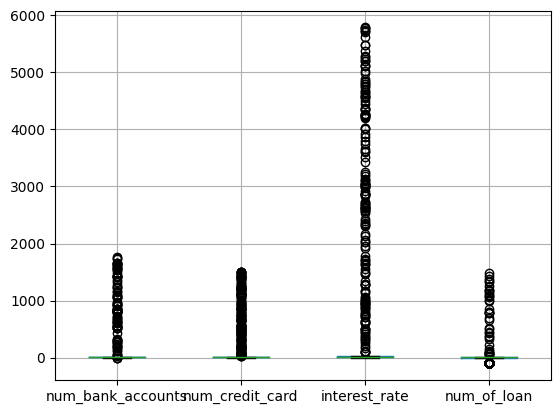

In [ ]:
df2[['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']].boxplot()
plt.show()

In [ ]:
print(len(df2[df2['num_bank_accounts'] > 100]))
print(len(df2[df2['num_credit_card'] > 100]))
print(len(df2[df2['interest_rate'] > 100]))
print(len(df2[df2['num_of_loan'] > 100]))

93
165
175
33


In [ ]:
columns = ['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

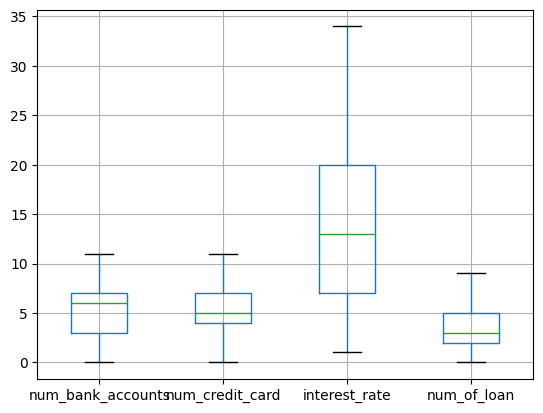

7026


In [ ]:
df3 = df2[df2['num_bank_accounts'] <= 20]
df3 = df3[df3['num_credit_card'] <= 20]
df3 = df3[df3['interest_rate'] <= 50]
df3 = df3[df3['num_of_loan'] <= 20]

df3 = df3[df3['num_bank_accounts'] >= 0]
df3 = df3[df3['num_credit_card'] >= 0]
df3 = df3[df3['interest_rate'] >= 0]
df3 = df3[df3['num_of_loan'] >= 0]

df3[['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']].boxplot()
plt.show()

print(len(df3))

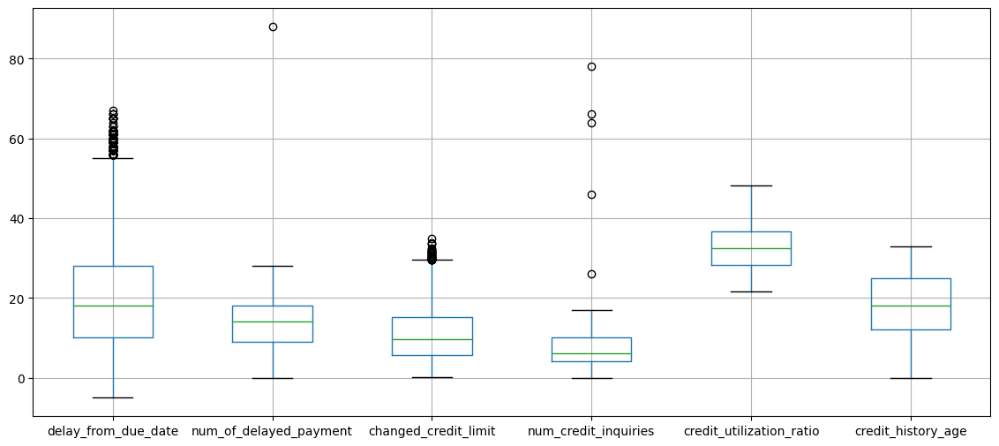

6710


In [ ]:
df3 = df3[df3['num_of_delayed_payment'] <= 100]
df3 = df3[df3['num_of_delayed_payment'] >= 0]
df3 = df3[df3['changed_credit_limit'] >= 0]
df3 = df3[df3['num_credit_inquiries'] <= 100]

fig, ax = plt.subplots(figsize=(14, 6))

ax = df3[['delay_from_due_date', 'num_of_delayed_payment', 'changed_credit_limit',
          'num_credit_inquiries', 'credit_utilization_ratio', 'credit_history_age']].boxplot()

plt.show()
print(len(df3))

In [ ]:
df2['credit_score'].unique()

array([0, 1])

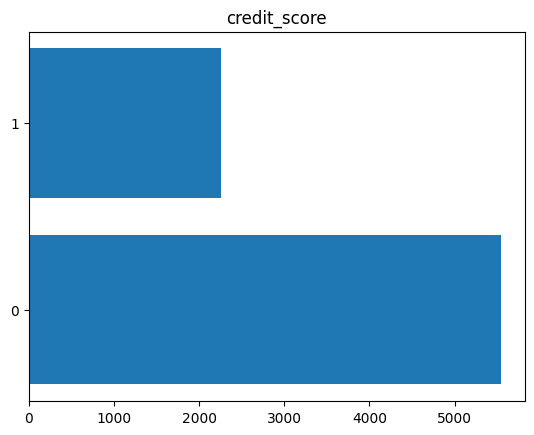

In [ ]:
n1 = df2['credit_score'].sum()
n0 = len(df2) - n1

fig, ax = plt.subplots()

ax.barh([1, 2], [n0, n1])
ax.set_yticks([1, 2])
ax.set_yticklabels(['0', '1'])
ax.set_title('credit_score')

plt.show()

In [ ]:
print(len(df2[df2['monthly_balance'] < -1e25]))
df2 = df2[df2['monthly_balance'] > -1e25].copy()

1


In [ ]:
print(len(df2[df2['amount_invested_monthly'] >= 10000]))

354


In [ ]:
columns = ['monthly_balance', 'amount_invested_monthly', 'outstanding_debt']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

In [ ]:
columns = ['monthly_balance', 'amount_invested_monthly']

fig = ff.create_distplot([df2[df2['amount_invested_monthly'] < 10000][c] for c in columns], columns, bin_size=.25)
fig.show()

In [ ]:
columns = ['total_emi_per_month']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

In [ ]:
len(df2[df2['total_emi_per_month'] > 1000])

305

In [ ]:
len(df2[df2['total_emi_per_month'] > 50000])

107

In [ ]:
columns = ['total_emi_per_month']

fig = ff.create_distplot([df2[df2['total_emi_per_month'] < 1000][c] for c in columns], columns, bin_size=.25)
fig.show()

In [ ]:
len(df2[df2['total_emi_per_month'] == 0])

804

In [ ]:
columns = ['total_emi_per_month']

df4 = df2[df2['total_emi_per_month'] > 0]
df4 = df4[df4['total_emi_per_month'] < 1000]

fig = ff.create_distplot([df4[c] for c in columns], columns, bin_size=.25)
fig.show()

In [ ]:
len(df.payment_of_min_amount.unique())

3

In [ ]:
df.payment_of_min_amount.unique()

array(['No', 'Yes', 'NM'], dtype=object)

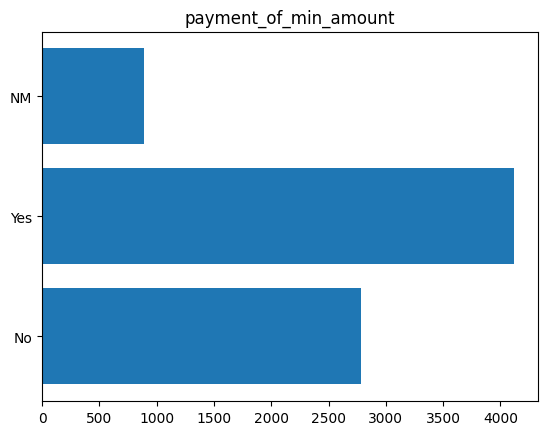

In [ ]:
n0 = len(df2[df2['payment_of_min_amount'] == 'No'])
n1 = len(df2[df2['payment_of_min_amount'] == 'Yes'])
n2 = len(df2[df2['payment_of_min_amount'] == 'NM'])

fig, ax = plt.subplots()

ax.barh([1, 2, 3], [n0, n1, n2])
ax.set_yticks([1, 2, 3])
ax.set_yticklabels(['No', 'Yes', 'NM'])
ax.set_title('payment_of_min_amount')

plt.show()

In [ ]:
len(df.payment_behaviour.unique())

7

In [ ]:
df.payment_behaviour.unique()

array(['High_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Small_value_payments', '!@9#%8',
       'Low_spent_Medium_value_payments',
       'High_spent_Large_value_payments',
       'Low_spent_Large_value_payments'], dtype=object)

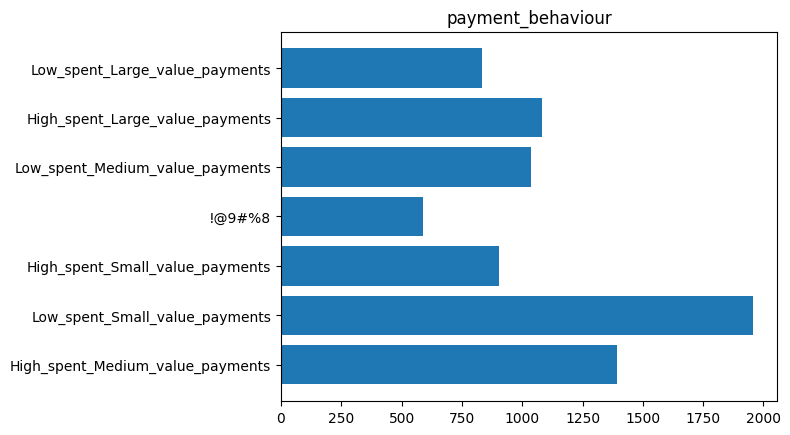

In [ ]:
nn = []
pb = df.payment_behaviour.unique()
for x in pb:
    nn.append(len(df2[df2['payment_behaviour'] == x]))

fig, ax = plt.subplots()

ax.barh(range(7), nn)
ax.set_yticks(range(7))
ax.set_yticklabels(pb)
ax.set_title('payment_behaviour')

plt.show()

In [ ]:
numcols = list(set(df.columns) - set(['customer_id', 'occupation',
                                        'payment_of_min_amount', 'payment_behaviour']))

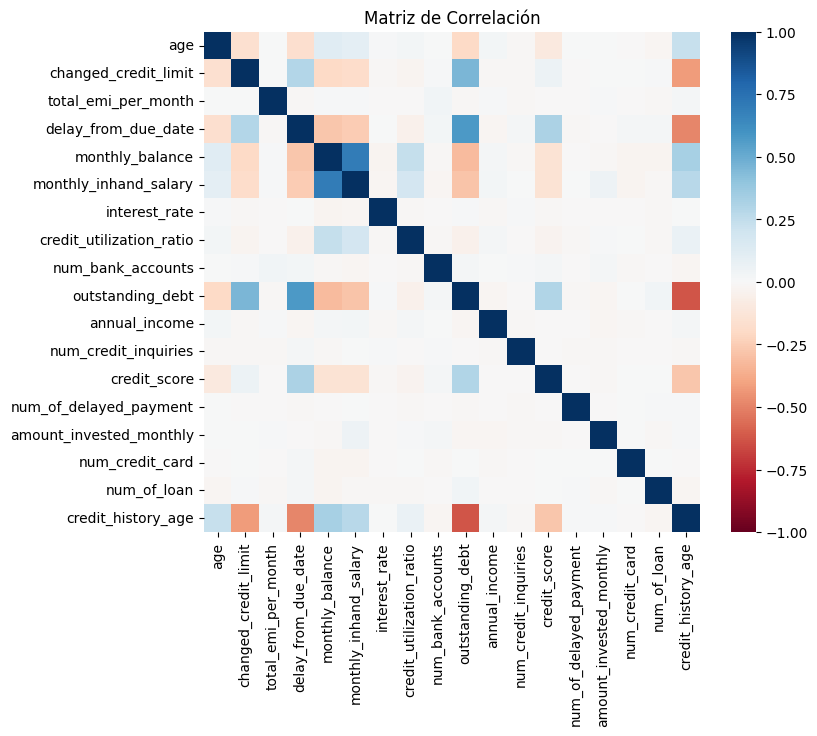

In [ ]:
fig, ax = plt.subplots(figsize=(8,6.5))

corr = df2[numcols].corr()

ax = sns.heatmap(corr,
                 xticklabels=corr.columns,
                 yticklabels=corr.columns,
                 vmax=1.0,
                 vmin=-1.0,
                 cmap='RdBu')

ax.set_title('Matriz de Correlación')

plt.show()

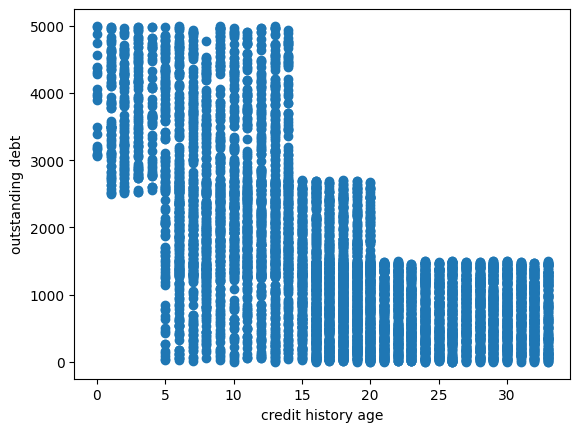

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df2.credit_history_age, df2.outstanding_debt)
ax.set_xlabel('credit history age')
ax.set_ylabel('outstanding debt')

plt.show()

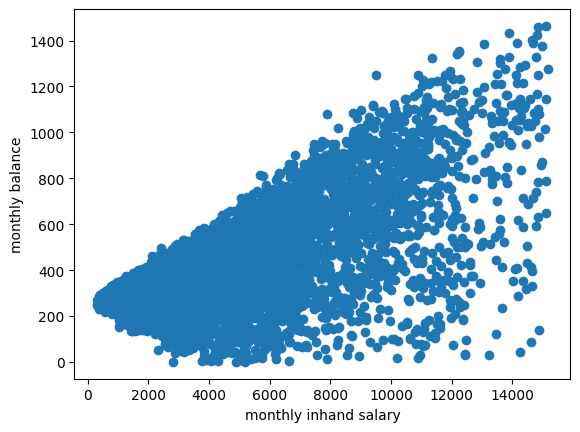

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df2.monthly_inhand_salary, df2.monthly_balance)
ax.set_xlabel('monthly inhand salary')
ax.set_ylabel('monthly balance')

plt.show()

In [ ]:
len(numcols)

18

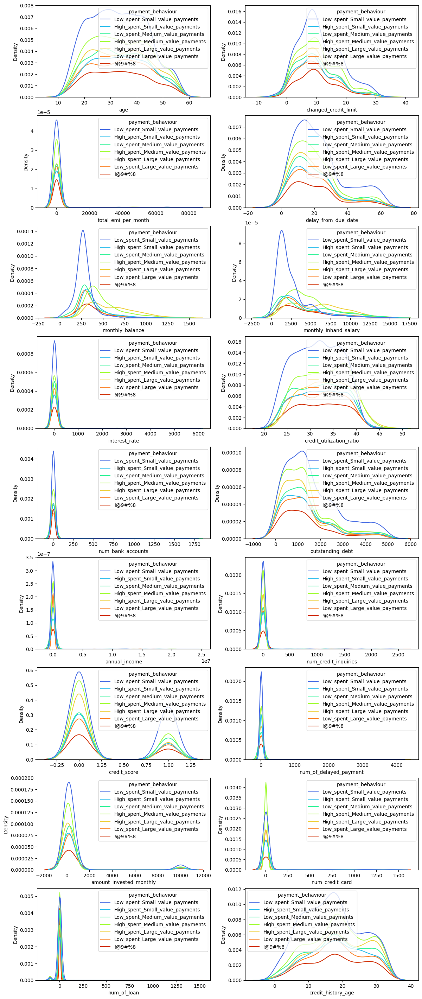

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='payment_behaviour', palette='turbo', ax = ax[i][j])
        c += 1

plt.show()

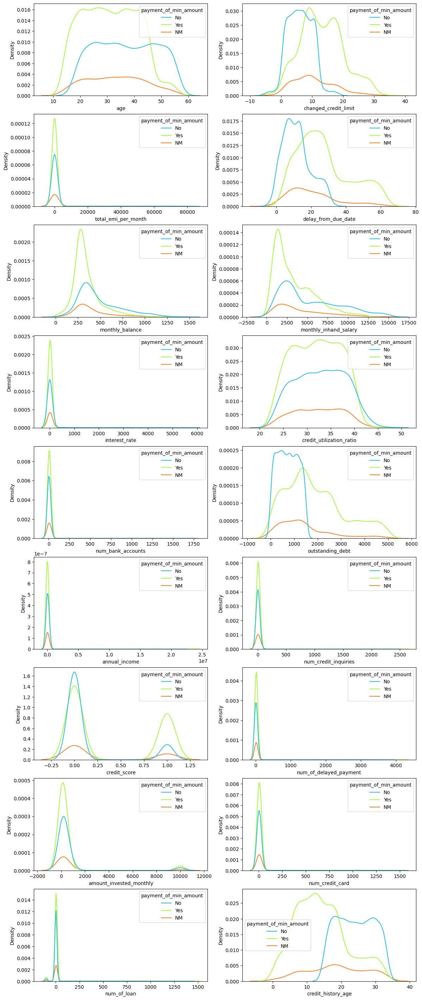

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='payment_of_min_amount', palette='turbo', ax = ax[i][j])
        c += 1

plt.show()

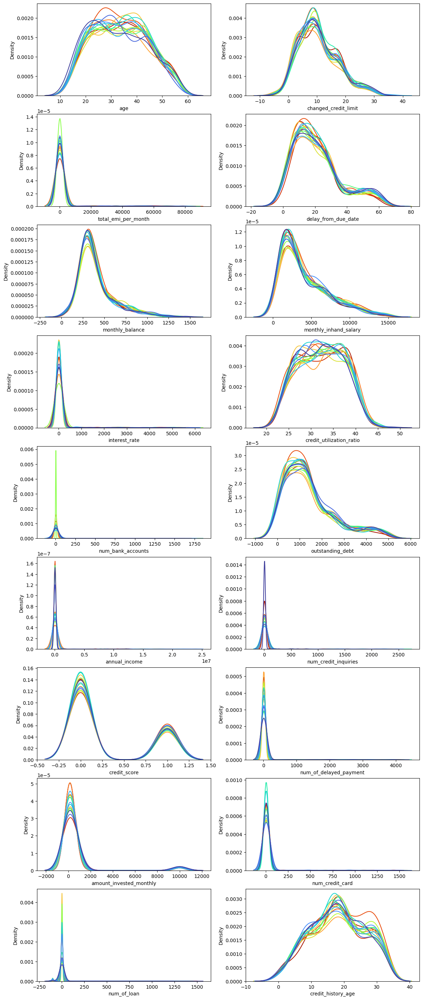

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='occupation', palette='turbo', ax = ax[i][j], legend=False)
        c += 1

plt.show()

In [ ]:
df.duplicated().sum()

0

## Preparación de Datos

### Nulos y Outliers

Del análisis exploratorio se conoce que varias columnas de dataframe presentan valores faltantes. Se decide eliminar las filas con datos nulos, reduciendo el número de filas a 7798.

In [ ]:
dfc = df.dropna()

También se observó la presencia de outliers, valores atípicos y otros directamente erroneos, como números negativos o edades por sobre 1000. Se remueven los valores negativos y outliers.

In [ ]:
dfc = dfc[dfc.age <= 100].copy()
dfc = dfc[dfc.age > 0].copy()

dfc = dfc[dfc['num_bank_accounts'] <= 20]
dfc = dfc[dfc['num_credit_card'] <= 20]
dfc = dfc[dfc['interest_rate'] <= 50]
dfc = dfc[dfc['num_of_loan'] <= 20]

dfc = dfc[dfc['num_bank_accounts'] >= 0]
dfc = dfc[dfc['num_credit_card'] >= 0]
dfc = dfc[dfc['interest_rate'] >= 0]
dfc = dfc[dfc['num_of_loan'] >= 0]

dfc = dfc[dfc['num_of_delayed_payment'] <= 100]
dfc = dfc[dfc['num_of_delayed_payment'] >= 0]
dfc = dfc[dfc['changed_credit_limit'] >= 0]
dfc = dfc[dfc['num_credit_inquiries'] <= 100]

dfc = dfc[dfc['monthly_balance'] > -1e25]
dfc = dfc[dfc.amount_invested_monthly < 2000]

dfc = dfc.reset_index().copy()
del dfc['index']

### Preprocesamiento

El dataset posee 3 atributos categóricos: "payment_behaviour", "payment_of_min_amount" y "occupation". El primero señala el comportamiento de pago de los usuarios, este se puede considerar un atributo ordinal, tomando 'Low_spent' < 'High_spent' y 'Small_value' < 'Medium_value' < 'Large_value', de modo que se reemplazan por enteros de 1 a 6 respetando el orden.  Además existe la categoría '!@9#%8', que claramente corresponde a un error en los datos, está puede ser una categoría real cuyo nombre se vió alterado o una categoría adicional para casos en los que ha habido un error en la variable, como datos faltantes. Dada la naturaleza desconocida de '!@9#%8', sería razonable eliminarla, sin embargo para una primera iteración se decide mantener la categoría, reemplazandola por -1.

El atributo "payment_of_min_amount" tiene 3 categorías, 'Yes', 'No' y 'MN', las cuales se reemplazan por 1, -1 y 0 respectivamente. El atributo "occupation" contiene más de 10 categorías nominales; por simplicidad se decide remover la columna.

Todas la variables se escalan con MinMaxScaler a valores entre 0 y 1.

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler, FunctionTransformer, RobustScaler

In [ ]:
d1 = dict(zip(['High_spent_Medium_value_payments', 'Low_spent_Small_value_payments', 'High_spent_Small_value_payments', '!@9#%8',
               'Low_spent_Medium_value_payments', 'High_spent_Large_value_payments', 'Low_spent_Large_value_payments'],
              [5, 1, 4, -1, 2, 6, 3]))

d2 = {'Yes': 1, 'No': -1, 'NM': 0}

dfc['payment_behaviour_n'] = dfc['payment_behaviour'].apply(lambda x: d1[x])
dfc['payment_of_min_amount_n'] = dfc['payment_of_min_amount'].apply(lambda x: d2[x])

In [ ]:
numcols = list(set(numcols)-set(['credit_score']))

ct = ColumnTransformer([
    #('identity', 'passthrough', ['credit_score']),
    ('minmax', MinMaxScaler(), numcols+['payment_behaviour_n', 'payment_of_min_amount_n'])
], verbose_feature_names_out=False)

ct.set_output(transform='pandas')

ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                 ['monthly_balance', 'amount_invested_monthly',
                                  'interest_rate', 'num_credit_card', 'age',
                                  'num_bank_accounts', 'monthly_inhand_salary',
                                  'credit_utilization_ratio',
                                  'total_emi_per_month', 'changed_credit_limit',
                                  'num_of_loan', 'num_credit_inquiries',
                                  'delay_from_due_date',
                                  'num_of_delayed_payment', 'outstanding_debt',
                                  'credit_history_age', 'annual_income',
                                  'payment_behaviour_n',
                                  'payment_of_min_amount_n'])],
                  verbose_feature_names_out=False)

In [ ]:
ct.fit_transform(dfc)

,age,changed_credit_limit,num_credit_inquiries,credit_history_age,num_bank_accounts,outstanding_debt,delay_from_due_date,total_emi_per_month,monthly_inhand_salary,annual_income,num_of_loan,num_credit_card,interest_rate,amount_invested_monthly,monthly_balance,credit_utilization_ratio,num_of_delayed_payment,payment_behaviour_n,payment_of_min_amount_n
1,0.333333,0.154067,0.025641,0.818182,0.181818,0.120993,0.111111,0.000232,0.183963,0.001168,0.111111,0.363636,0.151515,0.140008,0.243059,0.428190,0.045455,0.285714,0.0
6,0.476190,0.266743,0.051282,0.939394,0.000000,0.070396,0.069444,0.011226,0.683926,0.005216,0.222222,0.090909,0.212121,0.556773,0.270416,0.287880,0.022727,0.428571,0.0
7,0.380952,0.490658,0.115385,0.454545,0.727273,0.340923,0.486111,0.000868,0.155244,0.001136,0.333333,0.636364,0.424242,0.018757,0.280799,0.461512,0.159091,0.857143,1.0
8,0.238095,0.235125,0.102564,0.636364,0.181818,0.275605,0.222222,0.002795,0.641854,0.004525,0.333333,0.454545,0.181818,0.162820,0.507404,0.236393,0.125000,1.000000,0.0
12,0.523810,0.157517,0.089744,0.818182,0.545455,0.035792,0.208333,0.001532,0.300267,0.001988,0.333333,0.363636,0.393939,0.316670,0.100297,0.426128,0.090909,0.285714,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12279,0.690476,0.504168,0.153846,0.272727,0.909091,0.635575,0.347222,0.001154,0.090873,0.000539,0.777778,0.727273,1.000000,0.015339,0.196375,0.518480,0.193182,1.000000,1.0
12281,0.619048,0.077896,0.141026,0.515152,0.636364,0.307978,0.902778,0.001748,0.170507,0.001068,1.000000,0.909091,0.545455,0.123052,0.142885,0.334605,0.250000,0.714286,1.0
12282,0.428571,0.173326,0.012821,0.969697,0.454545,0.077765,0.208333,0.003574,0.949868,0.007074,0.333333,0.363636,0.000000,0.062590,0.884136,0.816700,0.022727,1.000000,0.0
12283,0.619048,0.192297,0.000000,0.878788,0.454545,0.089275,0.263889,0.002840,0.668692,0.004742,0.444444,0.090909,0.181818,0.126399,0.571091,0.574486,0.011364,1.000000,0.0


### Holdout

Se separan los datos en conjuntos de entrenamiento y prueba, con un 70% y 30% respectivamente.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dfc, dfc.credit_score, test_size=0.3, random_state=0, stratify=dfc.credit_score)

## Baseline

Se implementan los siguientes clasificadores con sus parámetros por defecto:

- Dummy
- Decision Tree
- Random Forest
- SVM
- Logistic Regression
- KNN
- GBM
- XGB

Luego se ajustan a los datos de entrenamiento y se evalúan con los datos de prueba, midiendo las métricas f1-score, accuracy y recall, donde se toma credit_score=1 como la clase positiva. Tras evaluar los clasificadores se puede ver que, para las métricas consideradas, todos obtienen mejores resultados en comparación a realizar una clasificación aleatoria. El modelo con mejor desempeño es LightGBMClassifier, con valores de 0.569,	0.777 y 0.501 en f1, accuracy y recall respectivamente, seguido de cerca por random forest en las 3 métricas.


In [ ]:
!pip install xgboost
!pip install lightgbm

In [ ]:
from sklearn.dummy import DummyClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, plot_importance
from lightgbm import LGBMClassifier

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, recall_score

from sklearn.pipeline import Pipeline

In [ ]:
def pipes(clf, ct):
    pipe = Pipeline([('Transform', ct),
                 ('Classifier', clf)])
    return pipe

clfs = [DummyClassifier(strategy='stratified'), SVC(), DecisionTreeClassifier(), RandomForestClassifier(),
        LogisticRegression(), KNeighborsClassifier(), XGBClassifier(), LGBMClassifier()]

names = ['DummyClassifier', 'SVC', 'DecisionTreeClassifier', 'RandomForestClassifier',
        'LogisticRegression', 'KNeighborsClassifier', 'XGBClassifier', 'LightGBMClassifier']

f1s = list()
acc = list()
rec = list()

for name, clf in zip(names, clfs):
    pipe = pipes(clf, ct)
    pipe.fit(X_train, y_train)
    yp = pipe.predict(X_test)
    print('-----'+name+'-----')
    print(classification_report(y_test, yp))
    f1s.append(f1_score(y_test, yp))
    acc.append(accuracy_score(y_test, yp))
    rec.append(recall_score(y_test, yp))

mdf = pd.DataFrame({'Classifier':names, 'F1':f1s, 'Accuracy':acc, 'Recall':rec})

-----DummyClassifier-----
              precision    recall  f1-score   support

           0       0.71      0.72      0.72      1358
           1       0.30      0.29      0.30       563

    accuracy                           0.59      1921
   macro avg       0.51      0.51      0.51      1921
weighted avg       0.59      0.59      0.59      1921

-----SVC-----
              precision    recall  f1-score   support

           0       0.80      0.90      0.85      1358
           1       0.65      0.46      0.54       563

    accuracy                           0.77      1921
   macro avg       0.73      0.68      0.69      1921
weighted avg       0.76      0.77      0.76      1921

-----DecisionTreeClassifier-----
              precision    recall  f1-score   support

           0       0.79      0.78      0.78      1358
           1       0.48      0.50      0.49       563

    accuracy                           0.69      1921
   macro avg       0.63      0.64      0.63      1921
w

In [ ]:
mdf

,Classifier,F1,Accuracy,Recall
0,DummyClassifier,0.295023,0.594482,0.289520
1,SVC,0.540146,0.770432,0.460036
2,DecisionTreeClassifier,0.487336,0.694430,0.495560
3,RandomForestClassifier,0.566497,0.777720,0.495560
4,LogisticRegression,0.483493,0.747527,0.403197
5,KNeighborsClassifier,0.513595,0.748568,0.452931
6,XGBClassifier,0.529589,0.755856,0.468917
7,LightGBMClassifier,0.569122,0.777720,0.500888


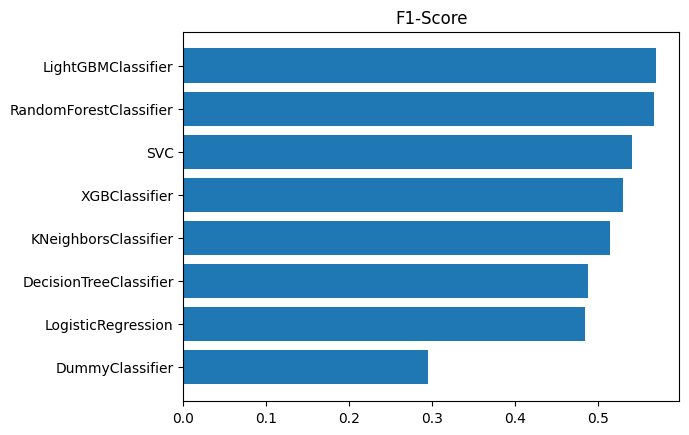

In [ ]:
mdf.sort_values(by='F1', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.F1)
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('F1-Score')

plt.show()

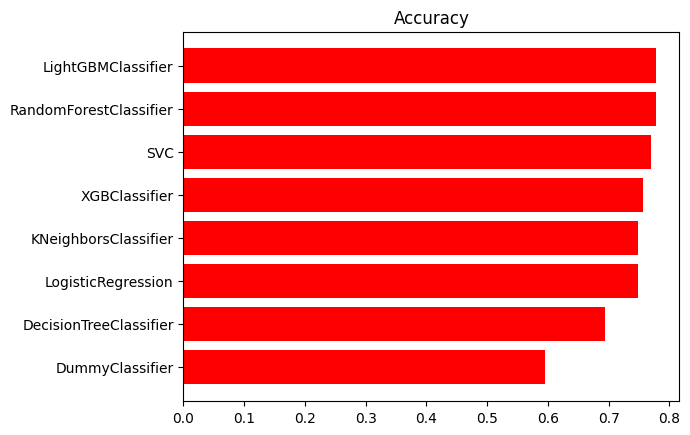

In [ ]:
mdf.sort_values(by='Accuracy', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.Accuracy, color='red')
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('Accuracy')

plt.show()

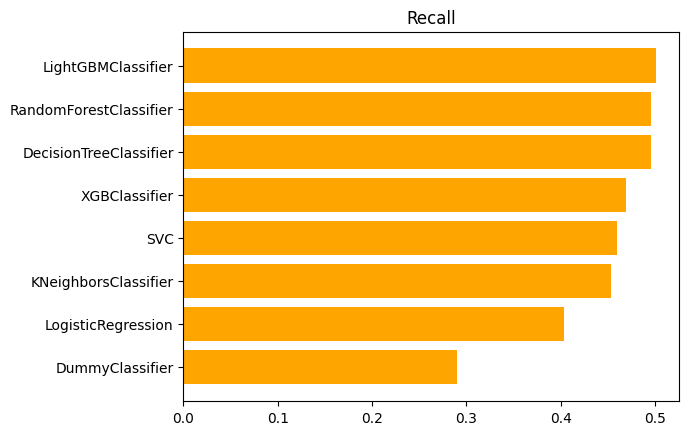

In [ ]:
mdf.sort_values(by='Recall', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.Recall, color='orange')
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('Recall')

plt.show()

## Optimización

Dados los resultados de la sección anterior, se seleccionan GBM y random forest como el mejor y segundo clasificador respectivamente, y se continua con estos a la etapa de optimización de hiper-parámetros. Para realizar la optimización se utiliza el método grid search sobre los siguientes hiper-parámetros:

Randomd Forest:
- **Criterion:** 'gini', 'entropy', 'log loss'
- **min samples split:** 2, 3, 4, 5
- **Número de estimadores:** 10, 50, 100, 150
- **Max features:** 'sqrt', 'log2'

Randomd Forest:
- **Tipo de boosting:** 'gbdt', 'dart', 'rf'
- **Learning rate:** $10^{-1}$, $10^{-2}$, $10^{-3}$
- **Número de estimadores:** 10, 50, 100, 150

Además, para los dos clasificadores, se les asigna peso a las clases para contrarrestar el desbalance de las mismas. La optimización de hiper-parámetros se realiza en base al f1 score.

Con la optimización de hipe-parámetros ambos modelos mejoran sus resultados, pero no en gran medida, random forest alcanza un f1 score de 0.58 y GBM de 0.6.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
y_train.sum() / len(y_train)

0.29330357142857144

In [ ]:
w = dict(zip([0, 1], compute_class_weight('balanced', classes=(0, 1), y=y_train)))

rfp = {'criterion':('gini', 'entropy', 'log_loss'),
       'min_samples_split': [2,3,4,5],
       'n_estimators': [10, 50, 100, 150],
       'max_features': ('sqrt', 'log2'),
       'class_weight': [w]}

pipe_rf_gs = Pipeline([('Transform', ct),
                 ('GridSCV', GridSearchCV(RandomForestClassifier(), rfp, scoring='f1'))])

lgp = {'boosting_type':('gbdt', 'dart', 'rf'),
       'learning_rate': [1e-1, 1e-2, 1e-3],
       'n_estimators': [10, 50, 100, 150],
       'class_weight': [w]}

pipe_lg_gs = Pipeline([('Transform', ct),
                 ('GridSCV', GridSearchCV(LGBMClassifier(), lgp, scoring='f1'))])

In [ ]:
pipe_rf_gs.fit(X_train, y_train)

Pipeline(steps=[('Transform',
                 ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                                  ['age',
                                                   'changed_credit_limit',
                                                   'num_credit_inquiries',
                                                   'credit_history_age',
                                                   'num_bank_accounts',
                                                   'outstanding_debt',
                                                   'delay_from_due_date',
                                                   'total_emi_per_month',
                                                   'monthly_inhand_salary',
                                                   'annual_income',
                                                   'num_of_loan',
                                                   'num_credit_card',
                                                   'interest_rate',
                                                   'amount_invested_mo...
                                                   'payment_behaviour_n',
                                                   'payment_of_min_amount_n'])],
                                   verbose_feature_names_out=False)),
                ('GridSCV',
                 GridSearchCV(estimator=RandomForestClassifier(),
                              param_grid={'class_weight': [{0: 0.7075173720783323,
                                                            1: 1.704718417047184}],
                                          'criterion': ('gini', 'entropy',
                                                        'log_loss'),
                                          'max_features': ('sqrt', 'log2'),
                                          'min_samples_split': [2, 3, 4, 5],
                                          'n_estimators': [10, 50, 100, 150]},
                              scoring='f1'))])

In [ ]:
pipe_rf_gs['GridSCV'].best_params_

{'class_weight': {0: 0.7075173720783323, 1: 1.704718417047184},
 'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_split': 5,
 'n_estimators': 150}

In [ ]:
rf_yp = pipe_rf_gs.predict(X_test)
rff1 = f1_score(y_test, rf_yp)
f1s.append(rff1)
print(rff1)

0.5808383233532934


In [ ]:
pipe_lg_gs.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_set=valid_sets,
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 748, in fit
    self._Booster = train(
  File "/usr/local

Pipeline(steps=[('Transform',
                 ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                                  ['age',
                                                   'changed_credit_limit',
                                                   'num_credit_inquiries',
                                                   'credit_history_age',
                                                   'num_bank_accounts',
                                                   'outstanding_debt',
                                                   'delay_from_due_date',
                                                   'total_emi_per_month',
                                                   'monthly_inhand_salary',
                                                   'annual_income',
                                                   'num_of_loan',
                                                   'num_credit_card',
                                                   'interest_rate',
                                                   'amount_invested_mo...
                                                   'credit_utilization_ratio',
                                                   'num_of_delayed_payment',
                                                   'payment_behaviour_n',
                                                   'payment_of_min_amount_n'])],
                                   verbose_feature_names_out=False)),
                ('GridSCV',
                 GridSearchCV(estimator=LGBMClassifier(),
                              param_grid={'boosting_type': ('gbdt', 'rf'),
                                          'class_weight': [{0: 0.7075173720783323,
                                                            1: 1.704718417047184}],
                                          'learning_rate': [0.1, 0.01, 0.001],
                                          'n_estimators': [10, 50, 100, 150]},
                              scoring='f1'))])

In [ ]:
pipe_lg_gs['GridSCV'].best_params_

{'boosting_type': 'gbdt',
 'class_weight': {0: 0.7075173720783323, 1: 1.704718417047184},
 'learning_rate': 0.1,
 'n_estimators': 10}

In [ ]:
lg_yp = pipe_lg_gs.predict(X_test)
lgf1 = f1_score(y_test, lg_yp)
f1s.append(lgf1)
print(lgf1)

0.6041009463722398


## Interpretabilidad

En esta sección se realiza un análisis de interpretabilidad simple sobre el modelo GBM entrenado en la etapa anterior, por medio de Shap values. Primero de revisa cuales son los atributos más significativos, a nivel global, para el modelo al momento de tomar decisiones. Se encontró que el atributo de mayor relevancia para predecir 'credit_score' es 'outstanding_debt', seguido de 'interest_rate' y 'delay_from_due_day', mientras que los de menor importancia son 'payment_of_min_amount', 'annual_income' y 'age'. En concreto se observa que a mayor sea la deuda y el tiempo de retraso en su pago, mayor es la probabilidad de tener más riesgo, aunque a la vez haber retrasado el pago más veces parece ser un indicador de bajo riesgo para el modelo.

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.9 MB/s eta 0:00:00


In [ ]:
import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
clf = LGBMClassifier(boosting_type='gbdt',
                     class_weight={0: 0.7075173720783323, 1: 1.704718417047184},
                     learning_rate=0.1,
                     n_estimators=10)

ct.fit(X_train)
X = ct.transform(dfc)

clf.fit(ct.transform(X_train), y_train)

explainer = shap.TreeExplainer(clf)
shap_values = explainer(X)

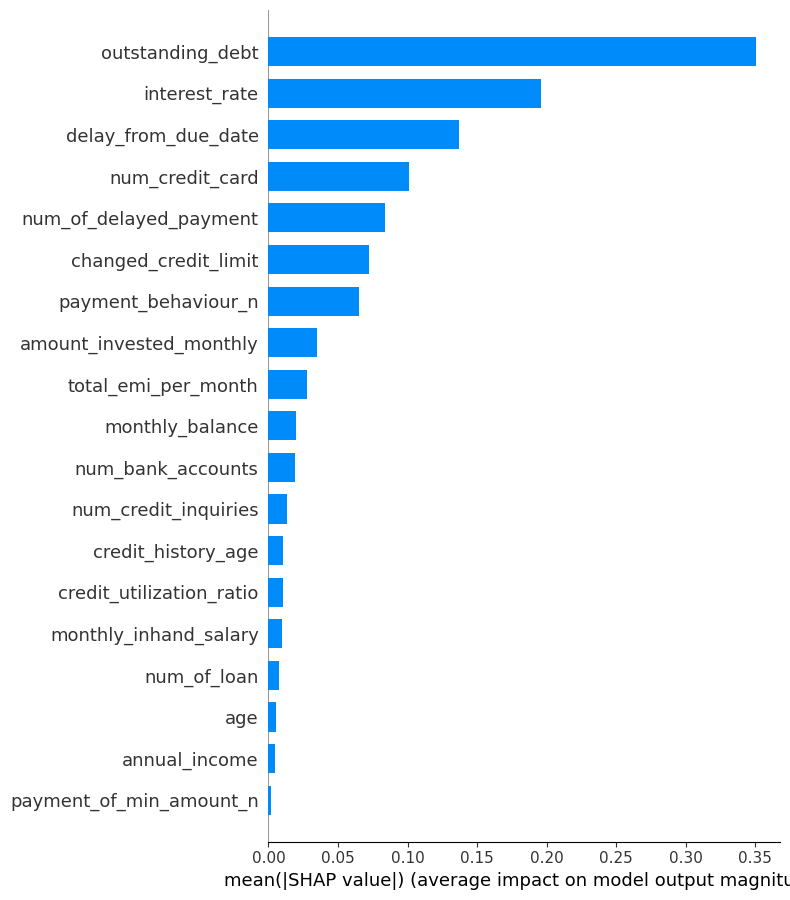

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


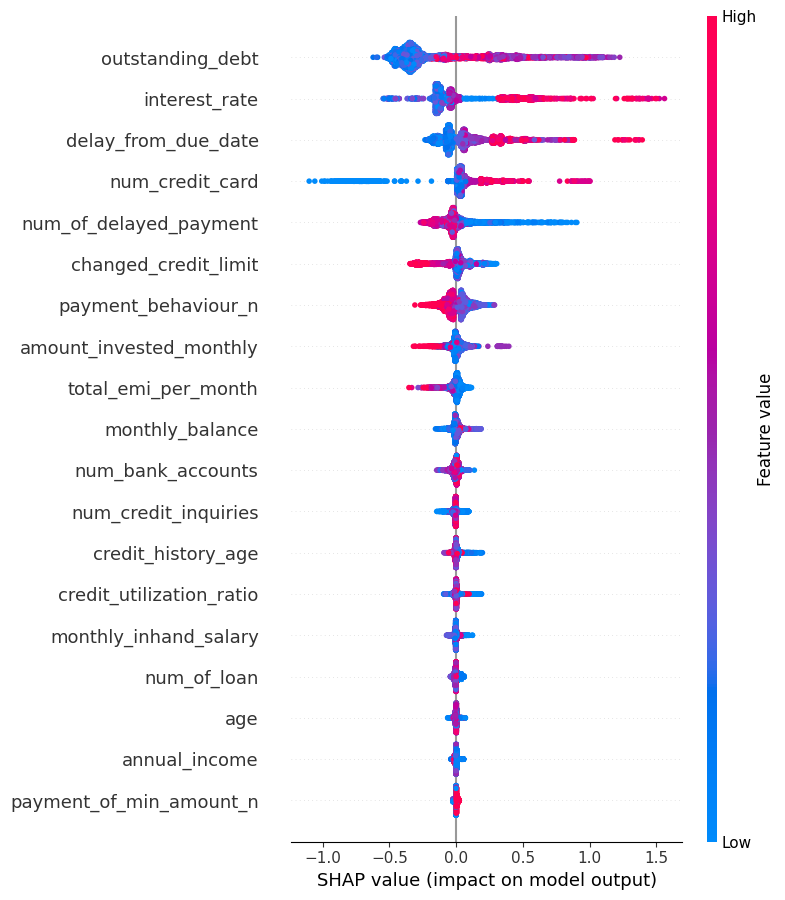

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X)

### 10 observaciones

Luego de haber hecho una revisión global, se procede a exminar el comportamiento del modelo en 10 predicciones particulares, elegidas aleatoriamente. Para cada caso se obtienen las siguientes observaciones:

- **1)** Es de bajo riesgo y se clasifica correctamente. Posee valores altos de 'interest_rate' y 'delay_from_due_date', estas son sus 2 características más influyentes, inclinando la clasificación a alto riesgo. También tiene un valor intermedio de 'changed_credit_limit', que ejerce casi la misma influencia que 'delay_from_due_date' en el sentido contrario, seguido por 'outstanding_debt', 'paymente_behaviuor' y 'num_of_delayed_payment'. El resto de variables apenas tiene efecto.
- **2)** Es de bajo riesgo y se clasifica correctamente. La variable más influyente para su clasificación como bajo riesgo es su bajo valor de 'outstanding_debt'. La variable más influyente para la clasificación de alto riesgo es su valor medio de 'delay_from_due_date', aunque sus valores bajos de 'num_of_delayed_payment' e 'interest_rate', y medio de 'changed_credit_limit' ejercen más del doble de efecto en el sentido opuesto.
- **3)** Es de alto riesgo se clasifica erroneamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' muy cercano al mínimo. También tiene un valor bajo de 'delay_from_due_date' que, si bien ejerce mucha menos influencia que 'outstanding_debt', es una característica que se asocia más al bajo riesgo.
- **4)** Es de alto riesgo y se clasifica correctamente. Se clasifica como de alto riesgo gracias a que posee el valor máximo de 'interst_rate'. La única variable con influencia relevante hacia la clasificación de bajo riesgo es su alto valor de 'changed_credit_limit'.
- **5)** Es de bajo riesgo y se clasifica erroneamente. Se clasifica como de alto riesgo gracias a 'changed_credit_limit', con un valor cercano al mínimo, y a los bajos valores de 'delay_from_due_date' y 'amount_invested_monthly'. Sus valores bajos de 'outstanding_debt' e 'interst_rate' inclinan la clasificación a bajo riesgo.
- **6)** Es de bajo riesgo y se clasifica correctamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' cercano al mínimo. El resto de variables son de poca influencia.
- **7)** Es de bajo riesgo y se clasifica correctamente. Las variables más influyentes son con valores medio altos de 'interest_rate' y 'changed_credit_limit', con influencia a favor de alto riesgo y bajo riesgo respectivamente.
- **8)** Es de alto riesgo y se clasifica correctamente. La clasificación de alto riesgo se debe principalmente a un valor muy alto de 'delay_from_due_date', también contribuye un valor alto de 'outstanding_debt'. Posee un valor alto de 'changed_credit_limit' que influye en favor de la clasificación de bajo riesgo.
- **9)** Es de bajo riesgo y se clasifica erroneamente. Posee altos valores de 'outstanding_debt' y 'num_credit_card', valor medio alto de 'delay_from_due_date', y bajo de 'changed_credit_limit'. Todas estas variables influyen a favor de la clasificación como de alto riesgo. El resto de variables no tienen efecto significativo.
- **10)** Es de bajo riesgo y se clasifica correctamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' cercano al mínimo.

En general se observa que el análisis global correlaciona con las observaciones particulares, manteniendo coherencia en qué valores de cada atributo tienen determinado efecto en la clasificación. Por otro lado se puede ver que dichas condiciones no son constantes en las clases, por ejemplo no todos los casos de alto riesgo tienen alto 'interest_rate' ni todos los de bajo riesgo un valor bajo. En la mayoría de los casos la predicción está determinada por unas pocas variables y en ocaciones todos los atributos relevantes contribuyen a una clasificación erronea.

Sample: 2305 Label: 0


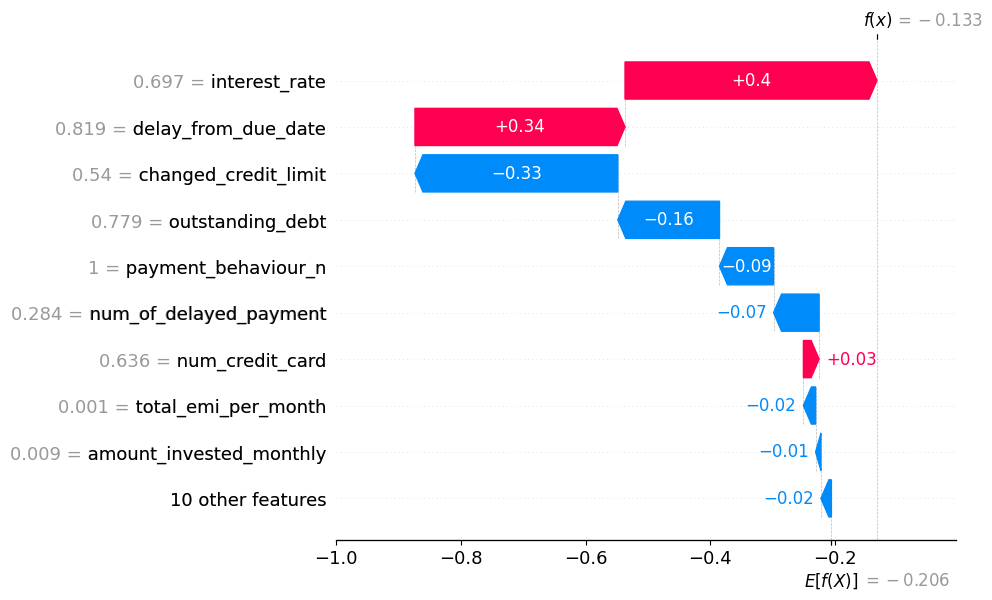

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 635 Label: 0


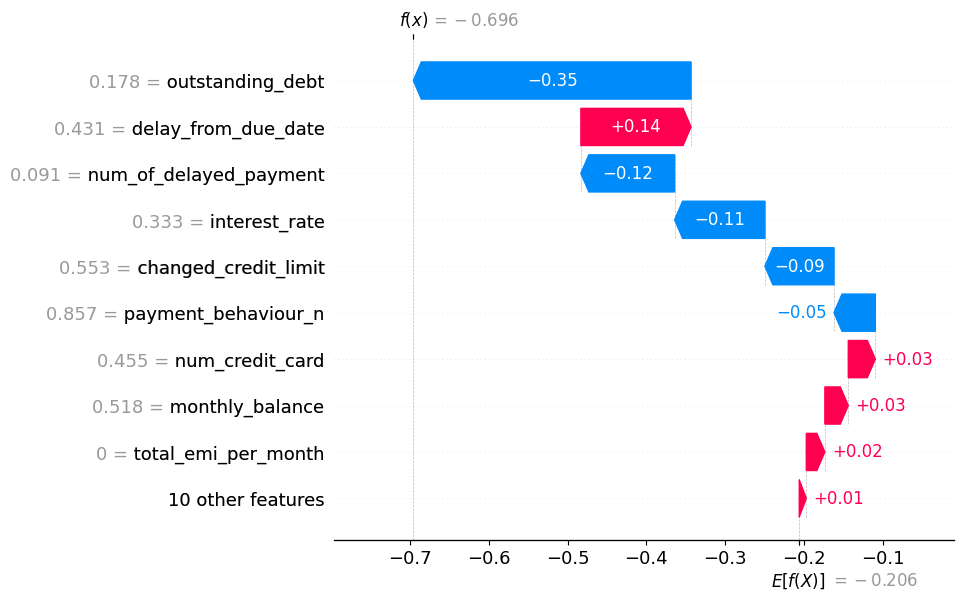

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 4737 Label: 1


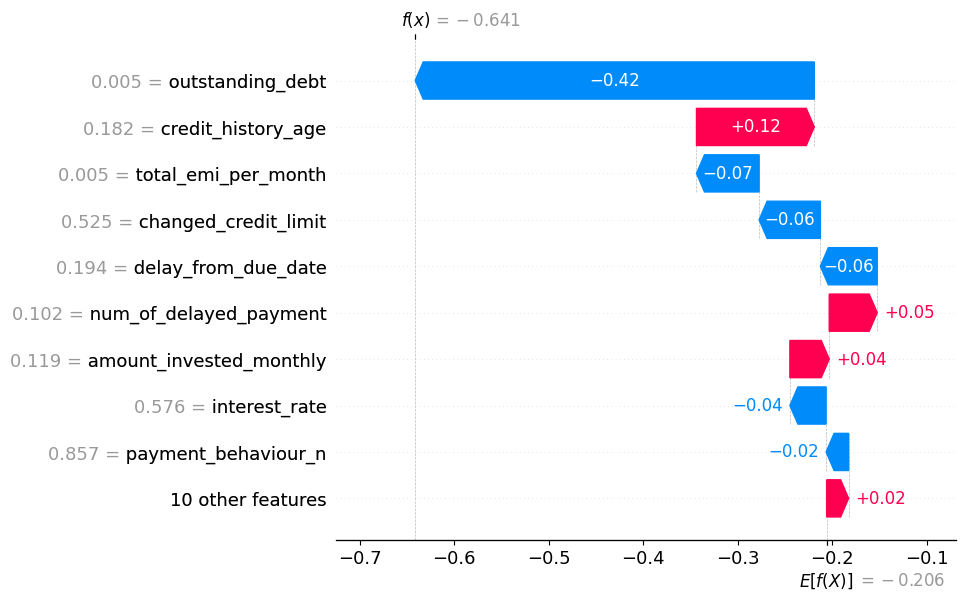

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 2556 Label: 1


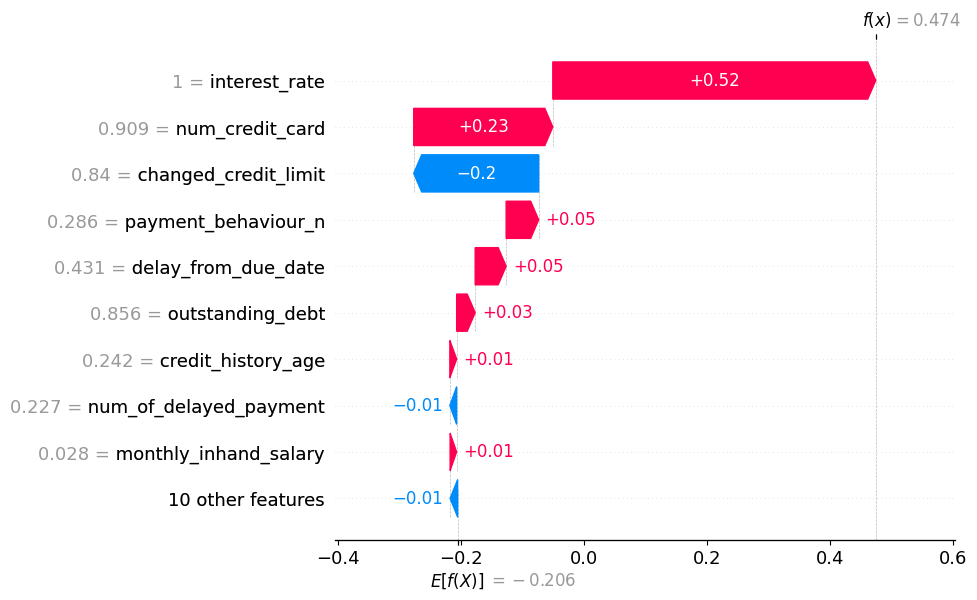

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 4024 Label: 0


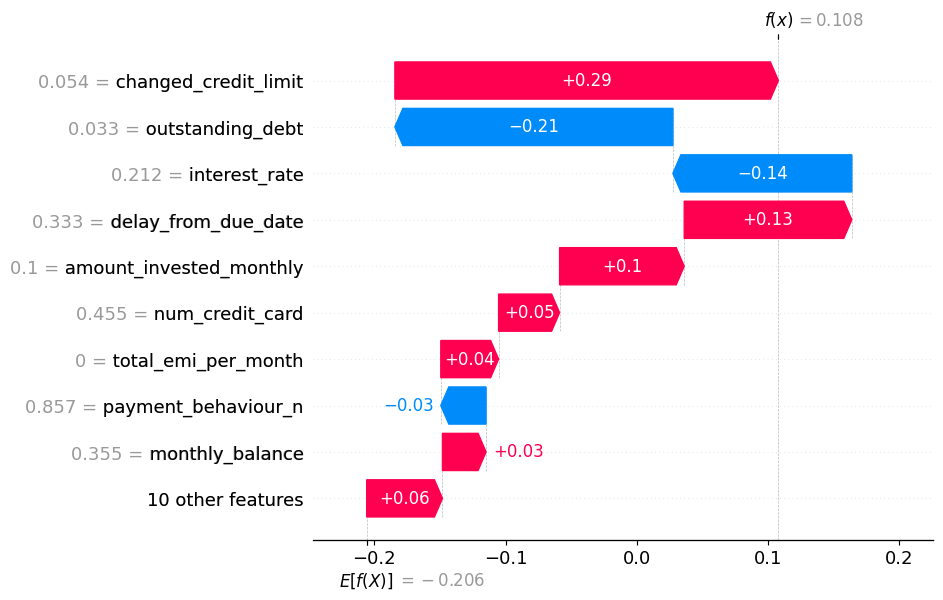

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 3895 Label: 0


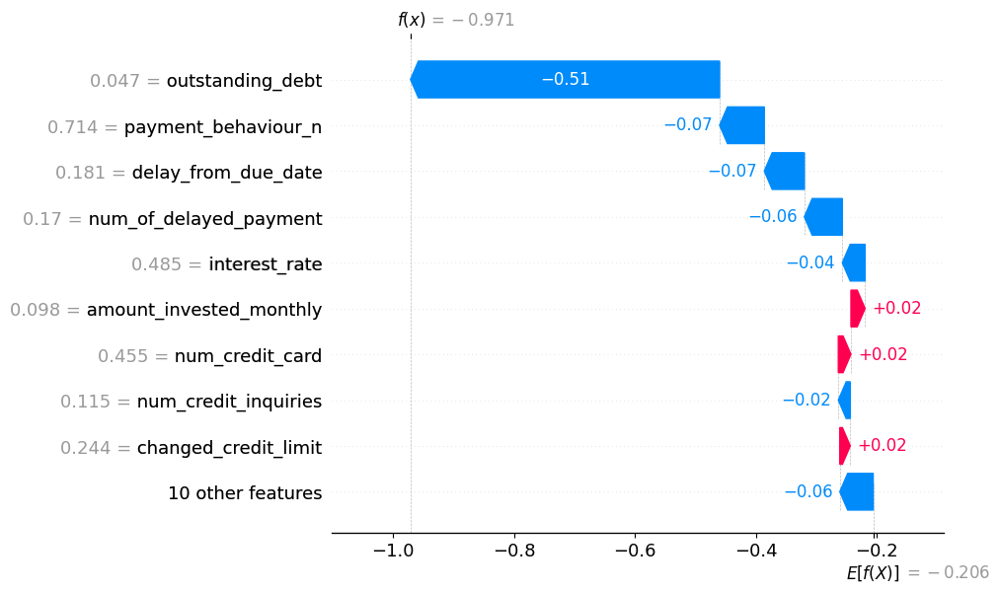

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 2111 Label: 0


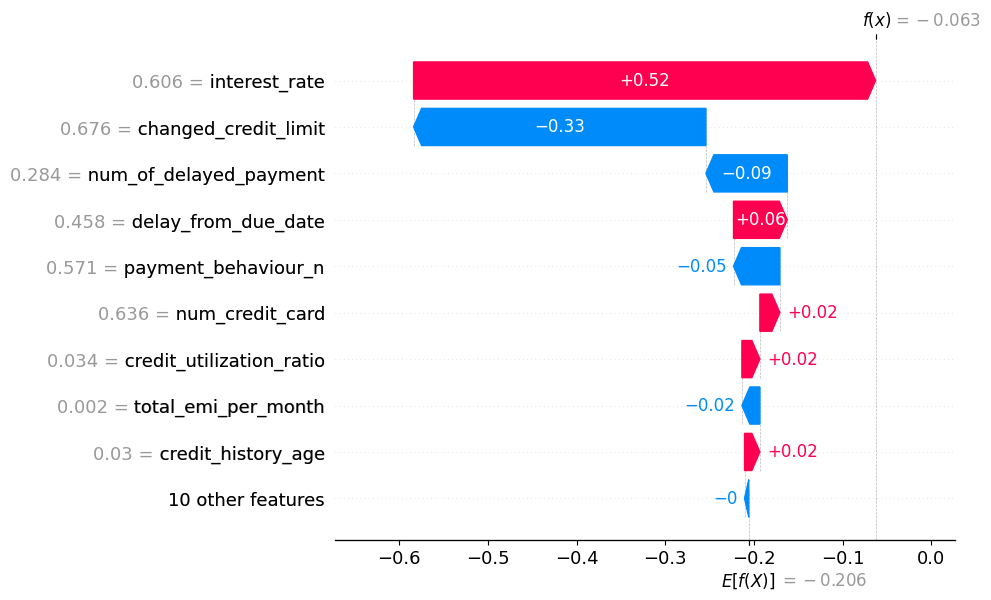

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 5647 Label: 1


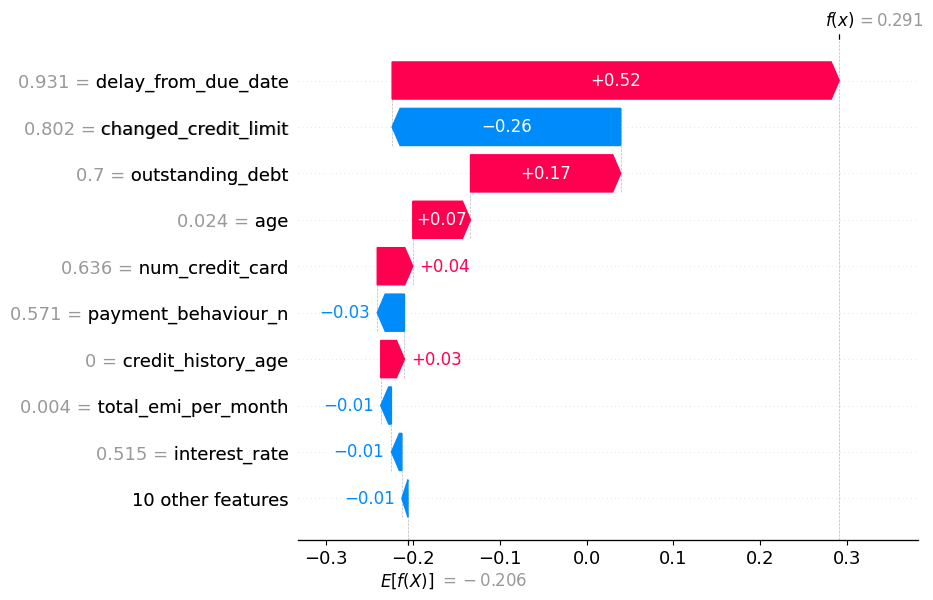

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 3612 Label: 0


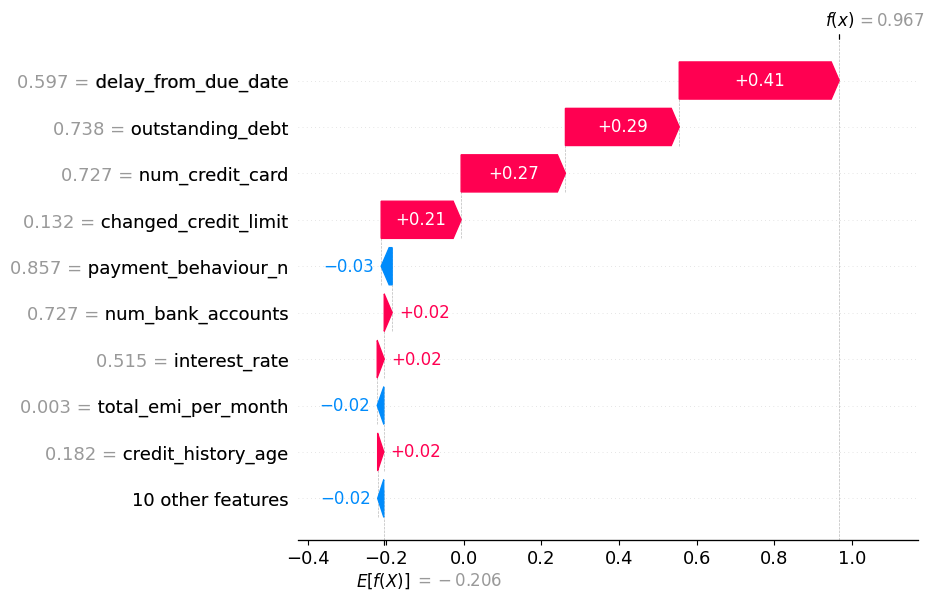

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 497 Label: 0


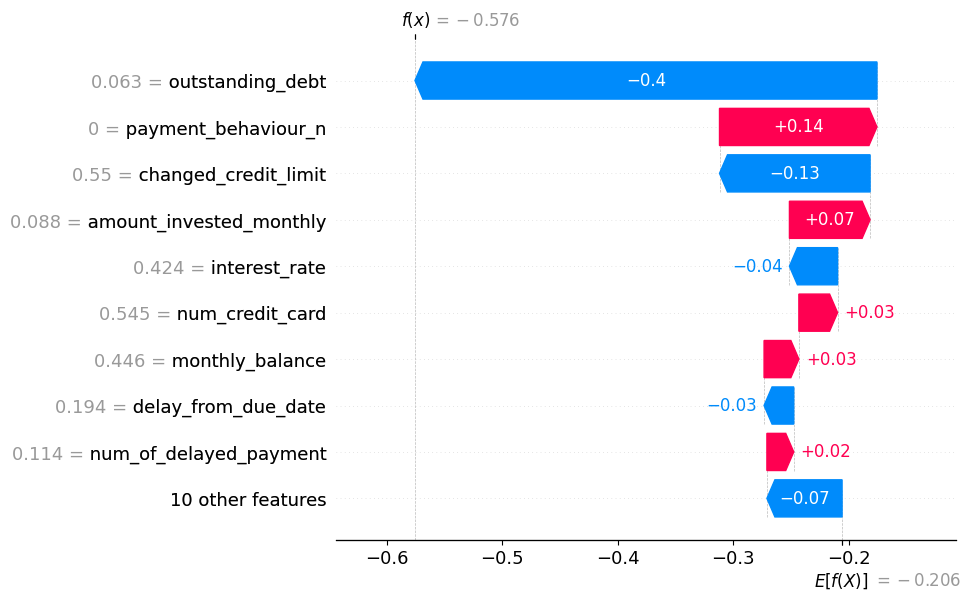

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

In [ ]:
clf.predict(X.iloc[[2305, 635, 4737, 2556, 4024, 3895, 2111, 5647, 3612, 497]])

array([0, 0, 0, 1, 1, 0, 0, 1, 1, 0])

### Relación entre variables

Por último se analizó la correlación entre algunos pares de atributos respecto a su influencia en la clasificación. Para 'outstanding_debt' se pueden distinguir 3 clusters en relación a su shap value, notando que los valores menores de 'interest_rate' se concentran principalmente en el cluster de menor 'outstanding_debt' y shap value. Se observa que a partir de cierto punto el atributo 'delay_from_due_date' sólo tiene shap values positivos y comienza a haber mayor presencia de valores altos de 'num_of_delayed_payment'. Para 'changed_credit_limit' se ve que, por sobre la mediana mayores valores de 'outstanding_debt' correlacionan a menor shap value, mientras que por de bajo de la mediana la correlación se invierte.

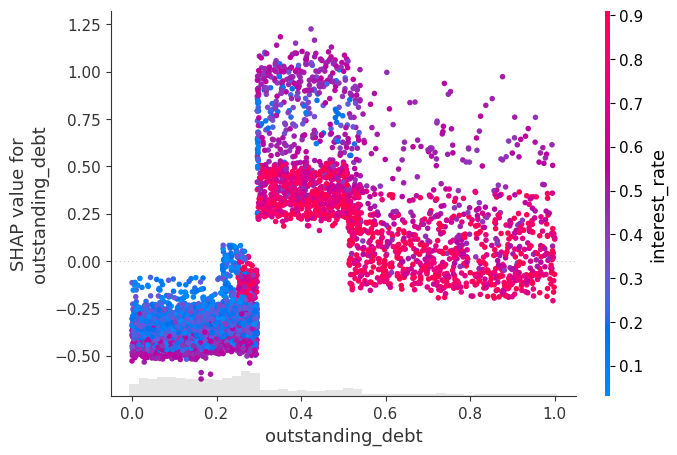

In [ ]:
shap.plots.scatter(shap_values[:,"outstanding_debt",1], color=shap_values[:,:,1])

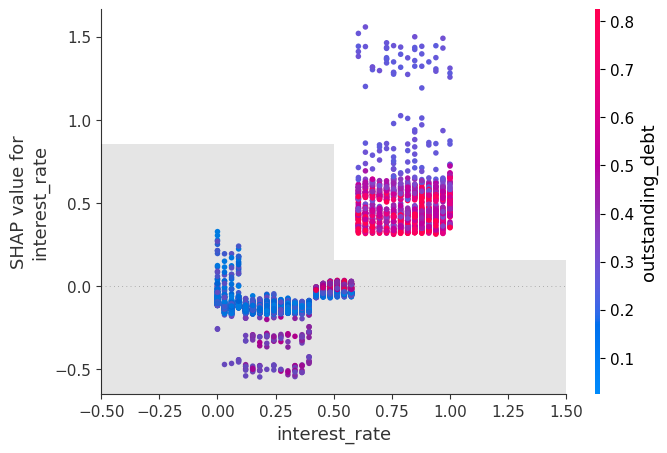

In [ ]:
shap.plots.scatter(shap_values[:,"interest_rate",1], color=shap_values[:,:,1])

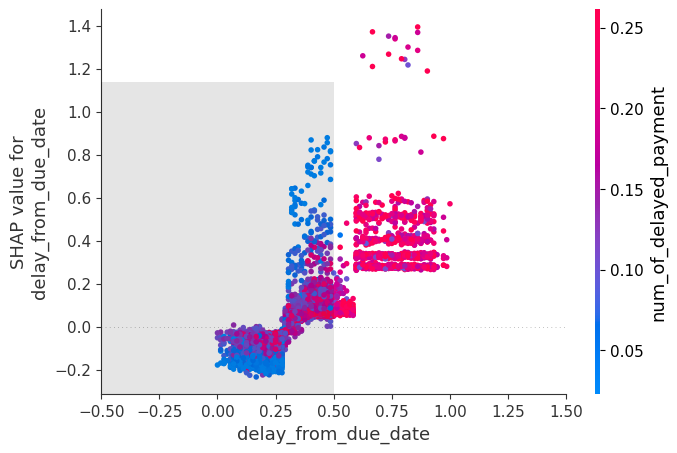

In [ ]:
shap.plots.scatter(shap_values[:,"delay_from_due_date",1], color=shap_values[:,:,1])

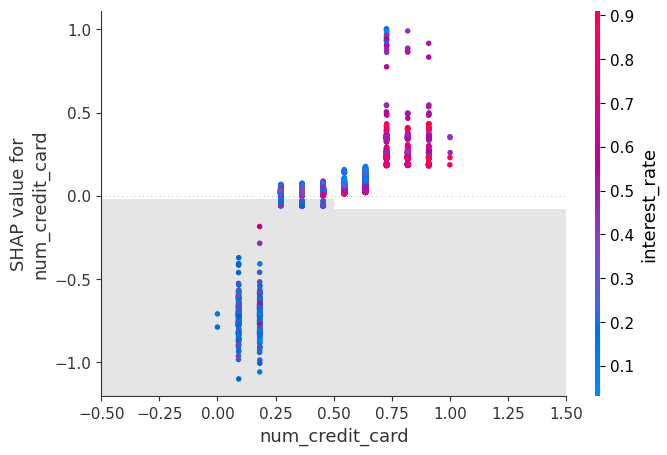

In [ ]:
shap.plots.scatter(shap_values[:,"num_credit_card",1], color=shap_values[:,:,1])

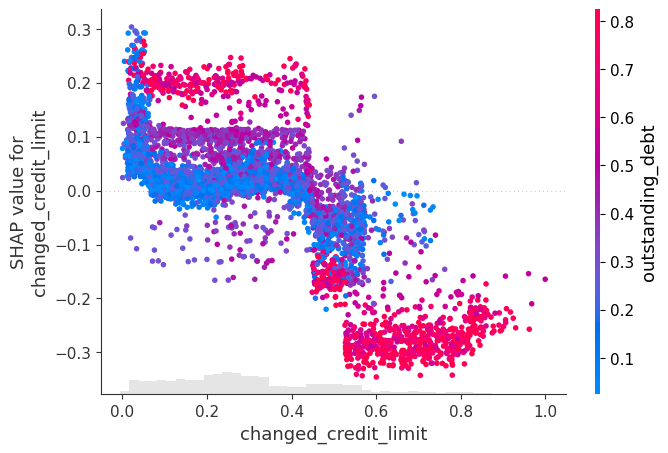

In [ ]:
shap.plots.scatter(shap_values[:,"changed_credit_limit",1], color=shap_values[:,:,1])

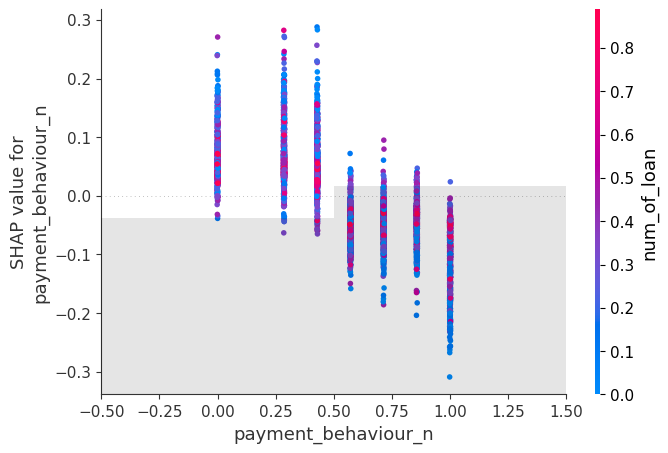

In [ ]:
shap.plots.scatter(shap_values[:,"payment_behaviour_n",1], color=shap_values[:,:,1])

## Conclusión

El rendimiento del baseline de la clasificación, en términos del f1-score, es superior al de una clasificación aleatoria, con valores entre 0.5 y 0.57, por sobre los 0.3 de esta última, evidenciando la capacidad de los modelos para aprender sobre el problema, pero no lo suficiente como para lograr una buena clasificación. Tras aplicar grid search sobre los mejores clasificadores probados inicialmente, fue posible lograr un ligero incremento en su rendimiento.

El mejor modelo encontrado es GBM, con un f1-score de 0.6 sobre la clase positiva, siendo esta los casos de alto riesgo. Estos resultados superan a una clasificación aleatoria y, del análisis de interpretabilidad, se puede concluir que existe algún criteria para la clasificación, que además hasta cierto punto considera la interacción entre las variables, sin embargo no se puede decir que 0.6 sea un resultado bueno ni aceptable, y sigue siendo más cercano al de un clasificador aleatorio que a uno ideal.

Dado lo ya expuesto, no se pudo resolver el problema, pero no estamos disconformes con los resultados, puesto que mejorarlos requiere de más tiempo del que disponíamos. Es probable que existan mejore formas de abordar el problema o de mejorar los resultados, como por ejemplo hacer una selección de característica, probar distintos métodos de pre-procesamiento, o utilizar modelos de clasificación más complejos.